# Sentinel Hub Process API

In this example notebook we show how to use Sentinel Hub Process API to download satellite imagery. We describe how to use various parameters and configurations to obtain either processed products or raw band data. For more information about the service please check the [official service documentation](https://docs.sentinel-hub.com/api/latest/api/process/).

## Prerequisites

### Credentials

Process API requires Sentinel Hub account. Please check [configuration instructions](https://sentinelhub-py.readthedocs.io/en/latest/configure.html) about how to set up your Sentinel Hub credentials.

In [ ]:
from sentinelhub import SHConfig

config = SHConfig()
config.sh_client_id = 'YOUR_CLIENT_ID_GOES_HERE' #put your client id from sentinel hub account here
config.sh_client_secret = 'YOUR_CLIENT_SECRET_GOES_HERE' #put your client secret from sentinel hub account here

config.save()

if not config.sh_client_id or not config.sh_client_secret:
    print("Warning! To use Process API, please provide the credentials (OAuth client ID and client secret).")

###  Imports 

In [10]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [11]:
import datetime
import os

import matplotlib.pyplot as plt
import numpy as np

from sentinelhub import (
    CRS,
    BBox,
    DataCollection,
    DownloadRequest,
    MimeType,
    MosaickingOrder,
    SentinelHubDownloadClient,
    SentinelHubRequest,
    bbox_to_dimensions,
)

# The following is not a package. It is a file utils.py which should be in the same folder as this notebook.
from utils import plot_image

### Setting area of interest

We will download Sentinel-2 imagery of [Betsiboka Estuary](https://en.wikipedia.org/wiki/Betsiboka_River) such as the one shown below (taken by Sentinel-2 on 2017-12-15):

![title](data/wms_TRUE_COLOR_EPSG4326_-16.15_46.16_-15.58_46.51_2017-12-15T07-12-03_512X856.png)

The bounding box in `WGS84` coordinate system is `[46.16, -16.15, 46.51, -15.58]` (longitude and latitude coordinates of lower left and upper right corners). You can get the bbox for a different area at the [bboxfinder](http://bboxfinder.com/) website.

All requests require bounding box to be given as an instance of `sentinelhub.geometry.BBox` with corresponding Coordinate Reference System (`sentinelhub.constants.CRS`). In our case it is in _WGS84_ and we can use the predefined _WGS84_ coordinate reference system from `sentinelhub.constants.CRS`.

In [139]:
toronto_coords_wgs84 = (-79.507176,43.589710,-79.209009,43.734604)

When the bounding box bounds have been defined, you can initialize the `BBox` of the area of interest. Using the `bbox_to_dimensions` utility function, you can provide the desired resolution parameter of the image in meters and obtain the output image shape.

In [140]:
resolution = 10
toronto_bbox = BBox(bbox=toronto_coords_wgs84, crs=CRS.WGS84)
toronto_size = bbox_to_dimensions(toronto_bbox, resolution=resolution)

print(f"Image shape at {resolution} m resolution: {toronto_size} pixels")

Image shape at 10 m resolution: (2372, 1657) pixels


## Example 1: True color (PNG) on a specific date

We build the request according to the [API Reference](https://docs.sentinel-hub.com/api/latest/reference/), using the `SentinelHubRequest` class. Each Process API request also needs an [evalscript](https://docs.sentinel-hub.com/api/latest/#/Evalscript/V3/README).


The information that we specify in the `SentinelHubRequest` object is: 

 * an evalscript,
 * a list of input data collections with time interval,
 * a format of the response,
 * a bounding box and it's size (size or resolution).

The evalscript in the example is used to select the appropriate bands. We return the RGB (B04, B03, B02) Sentinel-2 L1C bands.

The image from Jun 12th 2020 is downloaded. Without any additional parameters in the evalscript, the downloaded data will correspond to reflectance values in `UINT8` format (values in 0-255 range).

In [162]:
evalscript_true_color = """
    //VERSION=3

    function setup() {
        return {
            input: [{
                bands: ["B02", "B03", "B04"]
            }],
            output: {
                bands: 3
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B04, sample.B03, sample.B02];
    }
"""

request_true_color = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=("2023-05-29", "2023-06-01"),
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    bbox=toronto_bbox,
    size=toronto_size,
    config=config,
)

In [163]:
true_color_imgs = request_true_color.get_data()

# arsen's comment

**image is stored in a list, so in order to access it you need to point to it's first element. the image itself is a 3d numpy array - matrix of pixels, and each pixel is a combination of 3 values (red, green, blue)**

In [172]:
true_color_imgs[0].shape

(1657, 2372, 3)

The method `get_data()` will always return a list of length 1 with the available image from the requested time interval in the form of numpy arrays. 

In [164]:
print(f"Returned data is of type = {type(true_color_imgs)} and length {len(true_color_imgs)}.")
print(f"Single element in the list is of type {type(true_color_imgs[-1])} and has shape {true_color_imgs[-1].shape}")

Returned data is of type = <class 'list'> and length 1.
Single element in the list is of type <class 'numpy.ndarray'> and has shape (1657, 2372, 3)


Image type: uint8


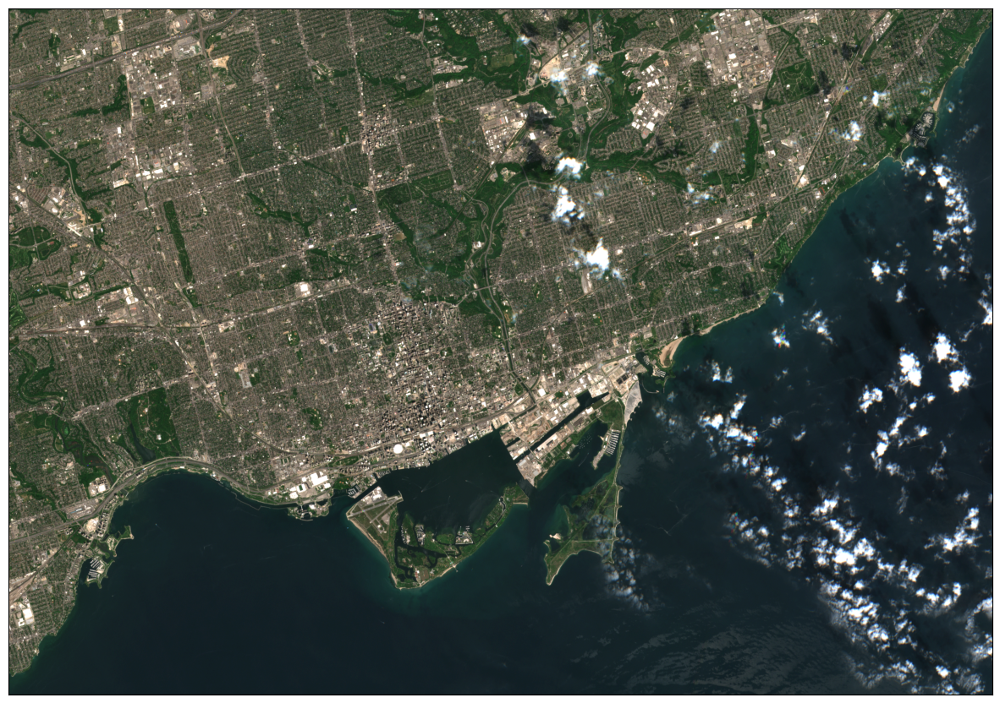

In [166]:
image = true_color_imgs[0]
print(f"Image type: {image.dtype}")

# plot function
# factor 1/255 to scale between 0-1
# factor 3.5 to increase brightness
plot_image(image, factor=3.5 / 255, clip_range=(0, 1))

### Example 1.1 Adding cloud mask data

It is also possible to obtain cloud masks when requesting Sentinel-2 data by using the cloud mask band (`CLM`) or the cloud probabilities band (`CLP`). More info [here](https://docs.sentinel-hub.com/api/latest/#/API/data_access?id=cloud-masks-and-cloud-probabilities).  

The factor for increasing the image brightness can already be provided in the evalscript.

In [167]:
evalscript_clm = """
//VERSION=3
function setup() {
  return {
    input: ["B02", "B03", "B04", "CLM"],
    output: { bands: 3 }
  }
}

function evaluatePixel(sample) {
  if (sample.CLM == 1) {
    return [0.75 + sample.B04, sample.B03, sample.B02]
  }
  return [3.5*sample.B04, 3.5*sample.B03, 3.5*sample.B02];
}
"""

request_true_color = SentinelHubRequest(
    evalscript=evalscript_clm,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=("2023-05-29", "2023-06-01"),
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    bbox=toronto_bbox,
    size=toronto_size,
    config=config,
)

In [168]:
data_with_cloud_mask = request_true_color.get_data()

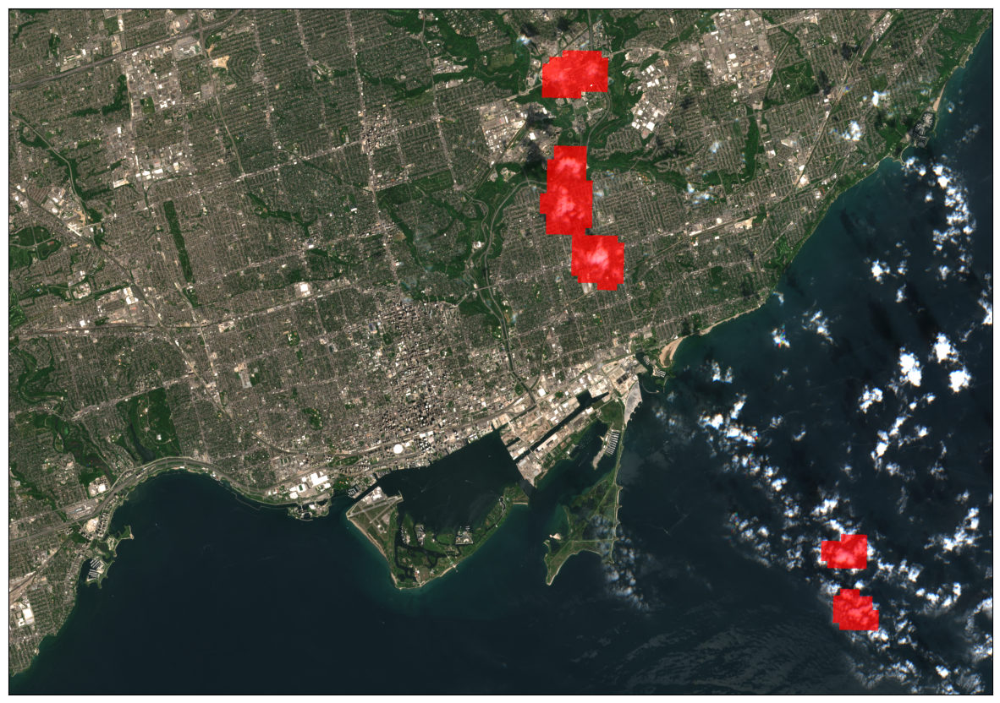

In [169]:
plot_image(data_with_cloud_mask[0], factor=1 / 255)

## Example 2: True color mosaic of least cloudy acquisitions  

The `SentinelHubRequest` automatically creates a mosaic from all available images in the given time interval. By default, the `mostRecent` mosaicking order is used. More information available [here](https://docs.sentinel-hub.com/api/latest/#/data/Sentinel-2-L2A?id=mosaickingorder).

In this example we will provide a month long interval, order the images w.r.t. the cloud coverage on the tile level (`leastCC` parameter), and mosaic them in the specified order.

In [170]:
request_true_color = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=("2023-05-10", "2023-06-20"),
            mosaicking_order=MosaickingOrder.LEAST_CC,
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    bbox=toronto_bbox,
    size=toronto_size,
    config=config,
)

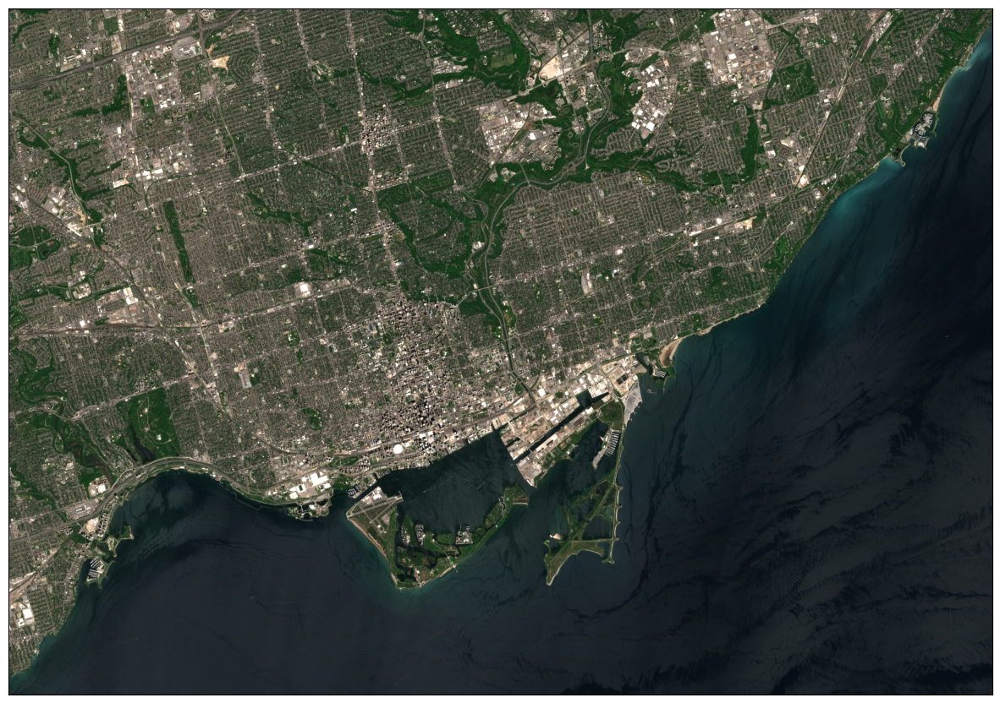

In [171]:
plot_image(request_true_color.get_data()[0], factor=3.5 / 255, clip_range=(0, 1))

## Example 3: All Sentinel-2's raw band values 

Now let's define an evalscript which will return all Sentinel-2 spectral bands with raw values.

In this example we are downloading already quite a big chunk of data, so optimization of the request is not out of the question. Downloading raw digital numbers in the `INT16` format instead of reflectances in the `FLOAT32` format means that much less data is downloaded, which results in a faster download and a smaller usage of SH processing units.

In order to achieve this, we have to set the input units in the evalscript to `DN` (digital numbers) and the output `sampleType` argument to `INT16`. Additionally, we can't pack all Sentinel-2's 13 bands into a `PNG` image, so we have to set the output image type to the `TIFF` format via `MimeType.TIFF` in the request.

The digital numbers are in the range from 0-10000, so we have to scale the downloaded data appropriately.

In [158]:
evalscript_all_bands = """
    //VERSION=3
    function setup() {
        return {
            input: [{
                bands: ["B01","B02","B03","B04","B05","B06","B07","B08","B8A","B09","B10","B11","B12"],
                units: "DN"
            }],
            output: {
                bands: 13,
                sampleType: "INT16"
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B01,
                sample.B02,
                sample.B03,
                sample.B04,
                sample.B05,
                sample.B06,
                sample.B07,
                sample.B08,
                sample.B8A,
                sample.B09,
                sample.B10,
                sample.B11,
                sample.B12];
    }
"""

request_all_bands = SentinelHubRequest(
    evalscript=evalscript_all_bands,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C,
            time_interval=("2023-05-10", "2023-06-20"),
            mosaicking_order=MosaickingOrder.LEAST_CC,
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
    bbox=toronto_bbox,
    size=toronto_size,
    config=config,
)

In [159]:
all_bands_response = request_all_bands.get_data()

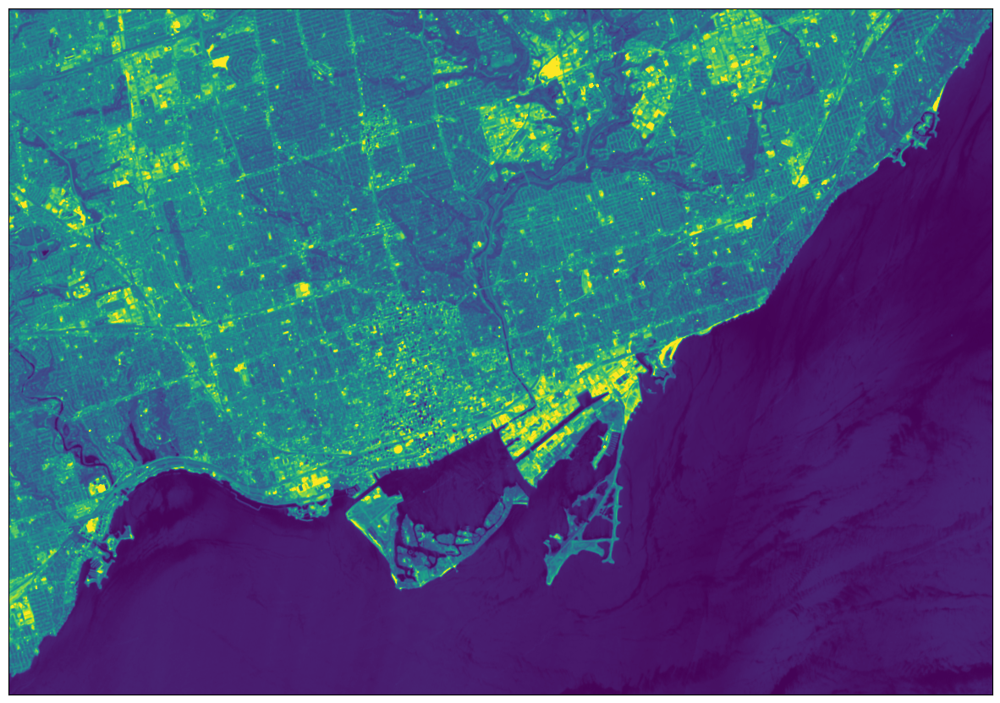

In [160]:
# Image showing the SWIR band B12
# Factor 1/1e4 due to the DN band values in the range 0-10000
# Factor 3.5 to increase the brightness
plot_image(all_bands_response[0][:, :, 12], factor=3.5 / 1e4, vmax=1)

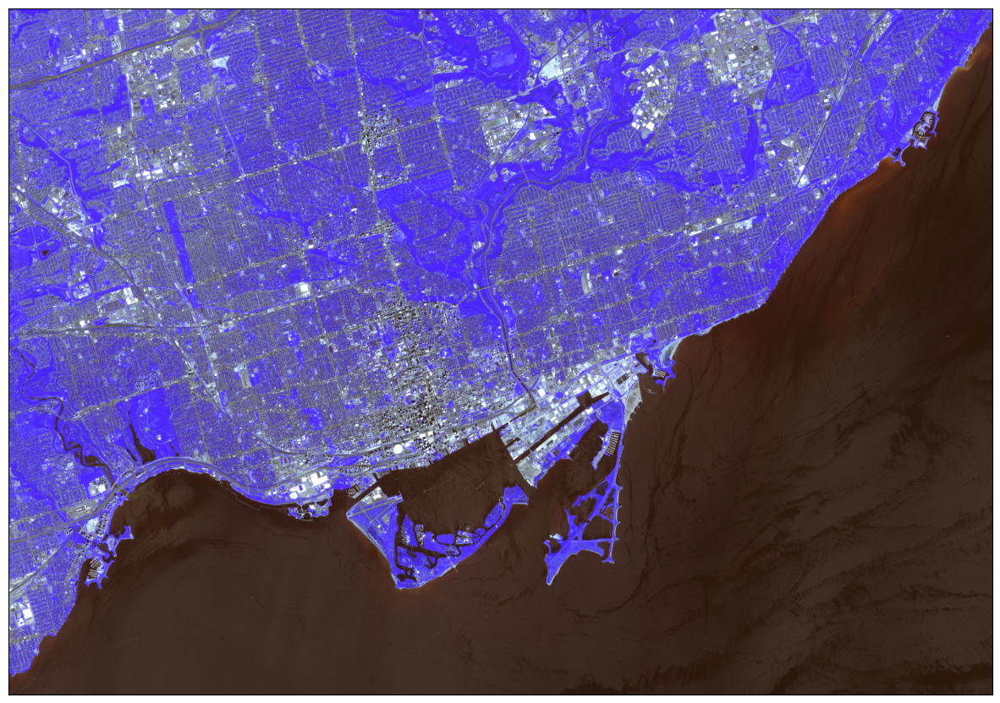

In [161]:
# From raw bands we can also construct a False-Color image
# False color image is (B03, B04, B08)
plot_image(all_bands_response[0][:, :, [2, 3, 7]], factor=3.5 / 1e4, clip_range=(0, 1))